#**KLASIFIKASI MULTILABEL BATIK BESUREK BENGKULU**

#**Data Loading dan Library**

### Mount Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

### Import Library

In [2]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.metrics import AUC


### Path Dataset

In [3]:
# Path dataset
train_csv_path = "/content/drive/MyDrive/Dataset/Data/train/_classes.csv"
test_csv_path = "/content/drive/MyDrive/Dataset/Data/test/_classes.csv"
valid_csv_path = "/content/drive/MyDrive/Dataset/Data/valid/_classes.csv"

# folder image dataset
train_img_folder = "/content/drive/MyDrive/Dataset/Data/train"
test_img_folder = "/content/drive/MyDrive/Dataset/Data/test"
valid_img_folder = "/content/drive/MyDrive/Dataset/Data/valid"

# Load CSV
train_df = pd.read_csv(train_csv_path)
test_df = pd.read_csv(test_csv_path)
valid_df = pd.read_csv(valid_csv_path)

# Validasi file gambar (hapus file yang tidak ada di folder)
train_df = train_df[train_df['filename'].apply(lambda x: os.path.exists(os.path.join(train_img_folder, x)))]
test_df = test_df[test_df['filename'].apply(lambda x: os.path.exists(os.path.join(test_img_folder, x)))]
valid_df = valid_df[valid_df['filename'].apply(lambda x: os.path.exists(os.path.join(valid_img_folder, x)))]


# **Data Understanding**


### Total Jumlah Data Train dan Test


In [4]:
print("Total gambar Train yang valid:", len(train_df))
print("Total gambar Val yang valid:", len(valid_df))
print("Total gambar Test yang valid:", len(test_df))

Total gambar Train yang valid: 6633
Total gambar Val yang valid: 1894
Total gambar Test yang valid: 947


In [5]:
# Tampilkan 5 baris pertama dari train_df
train_df.head()


,filename,Burung Kuau,Burung Punai,Kaligrafi,Kaligrafi Lawas,Kembang Cempaka,Kembang Cengkeh,Kembang Melati,Pohon Hayat,Rafflesia,Relung Paku,Rembulan
0,IMG_6110_jpeg_jpg.rf.9d4b86164acf2c21dbdc839e0...,0,1,1,0,0,0,0,0,0,1,0
1,20241030_154906-1-_jpg.rf.650c2e3cfec4af28672f...,1,0,1,0,0,0,0,0,0,0,0
2,IMG_20250107_143713_jpg.rf.7e1285ab5930922b64e...,0,0,1,0,0,0,0,0,0,0,1
3,IMG_6115_jpeg_jpg.rf.dfbb8407f8a92e602bedbc1e2...,0,1,1,0,0,0,0,0,0,1,0
4,20241030_144301_jpg.rf.4c2fe5457ca5bac45387f01...,0,0,1,0,0,0,1,0,0,0,0


### Jumlah Data di Setiap Label

In [6]:
print("Distribusi Label Train:")
print(train_df.iloc[:, 1:].sum())

print("\nDistribusi Label Valid:")
print(valid_df.iloc[:, 1:].sum())

print("\nDistribusi Label Test:")
print(test_df.iloc[:, 1:].sum())


Distribusi Label Train:
Burung Kuau        1658
Burung Punai        830
Kaligrafi          4975
Kaligrafi Lawas     829
Kembang Cempaka     829
Kembang Cengkeh     829
Kembang Melati      829
Pohon Hayat         829
Rafflesia           829
Relung Paku         830
Rembulan            829
dtype: int64

Distribusi Label Valid:
Burung Kuau         462
Burung Punai        225
Kaligrafi          1402
Kaligrafi Lawas     244
Kembang Cempaka     235
Kembang Cengkeh     235
Kembang Melati      239
Pohon Hayat         232
Rafflesia           248
Relung Paku         225
Rembulan            241
dtype: int64

Distribusi Label Test:
Burung Kuau        232
Burung Punai       112
Kaligrafi          701
Kaligrafi Lawas    122
Kembang Cempaka    117
Kembang Cengkeh    117
Kembang Melati     119
Pohon Hayat        116
Rafflesia          124
Relung Paku        112
Rembulan           121
dtype: int64


In [7]:
import pandas as pd

# Menghitung jumlah sampel per label di setiap dataset
train_label_counts = train_df.iloc[:, 1:].sum()
valid_label_counts = valid_df.iloc[:, 1:].sum()
test_label_counts = test_df.iloc[:, 1:].sum()

# Membuat DataFrame untuk tampilan tabel
label_distribution_df = pd.DataFrame({
    "Train": train_label_counts,
    "Valid": valid_label_counts,
    "Test": test_label_counts,
    "Total": train_label_counts + valid_label_counts + test_label_counts  # Menambahkan kolom total
})

# Menampilkan tabel dengan format rapi
print("\n=== Distribusi Label di Dataset ===")
print(label_distribution_df)



=== Distribusi Label di Dataset ===
                 Train  Valid  Test  Total
Burung Kuau       1658    462   232   2352
Burung Punai       830    225   112   1167
Kaligrafi         4975   1402   701   7078
Kaligrafi Lawas    829    244   122   1195
Kembang Cempaka    829    235   117   1181
Kembang Cengkeh    829    235   117   1181
Kembang Melati     829    239   119   1187
Pohon Hayat        829    232   116   1177
Rafflesia          829    248   124   1201
Relung Paku        830    225   112   1167
Rembulan           829    241   121   1191


### Grafik Distribusi Label

<ipython-input-8-cba89e85b8e1>:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(y='Label Combination', x='Count', data=combo_counts, palette='magma')


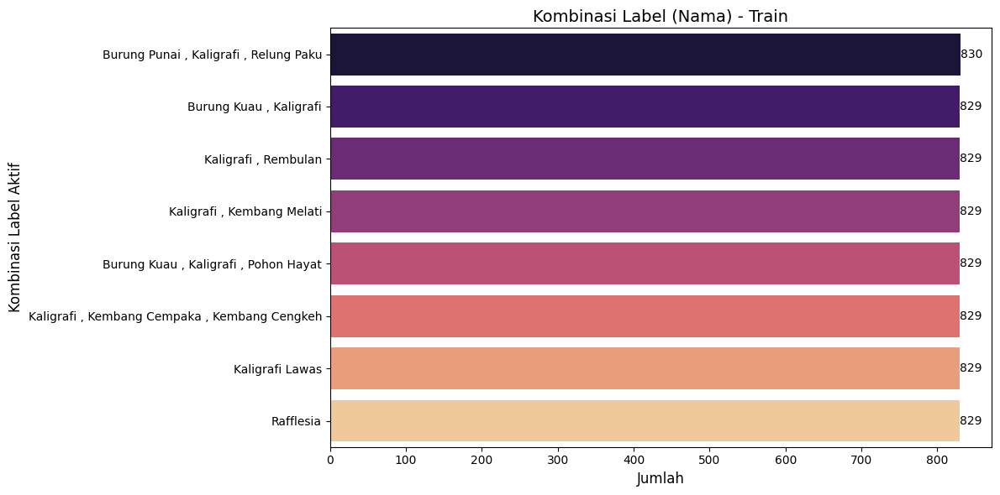

<ipython-input-8-cba89e85b8e1>:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(y='Label Combination', x='Count', data=combo_counts, palette='magma')


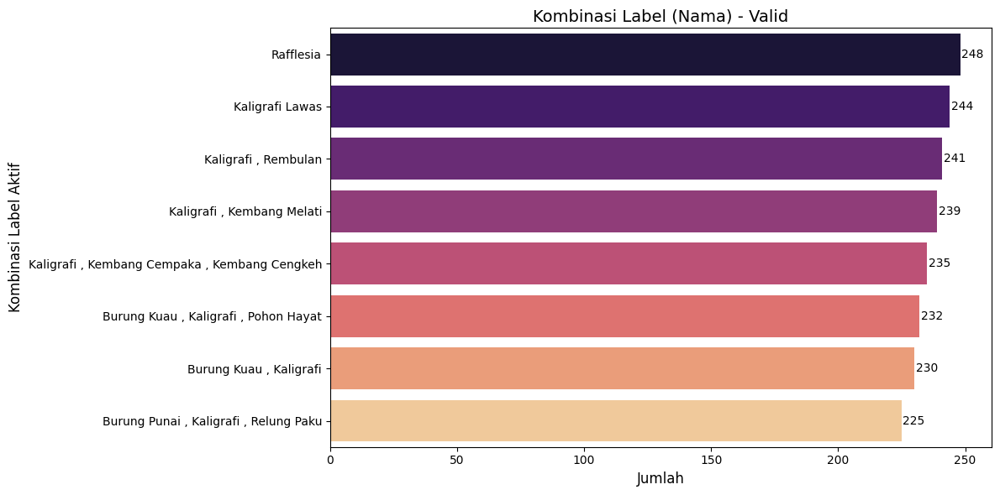

<ipython-input-8-cba89e85b8e1>:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(y='Label Combination', x='Count', data=combo_counts, palette='magma')


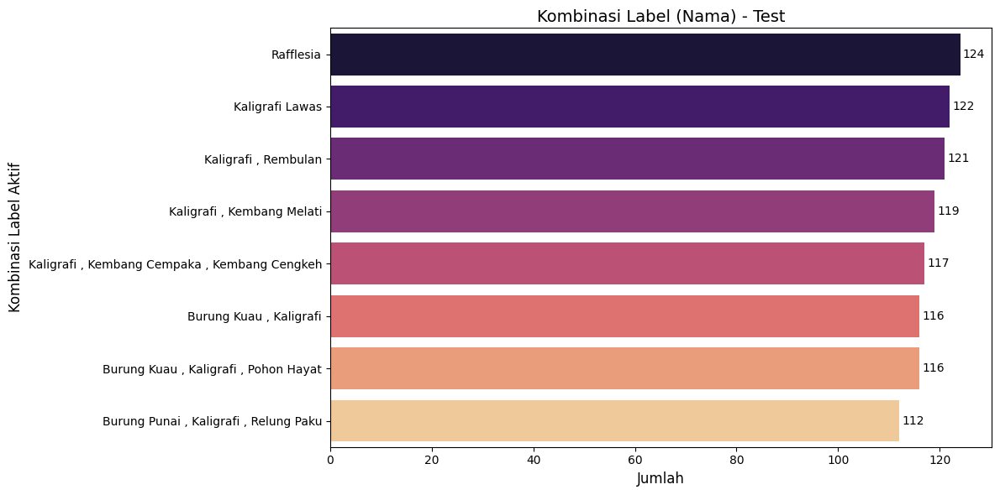

In [8]:
# Fungsi ambil kombinasi label pakai nama label
def get_named_label_combinations(df):
    label_cols = df.columns[1:]  # Ambil semua kolom label
    def combo_to_names(row):
        return ' , '.join([label for label, val in zip(label_cols, row) if val == 1]) or 'No Label'

    combos = df[label_cols].apply(combo_to_names, axis=1)
    combo_counts = combos.value_counts().reset_index()
    combo_counts.columns = ['Label Combination', 'Count']
    return combo_counts

# Fungsi buat plot + label jumlah
def plot_combinations(combo_counts, dataset_name):
    plt.figure(figsize=(12, 6))
    ax = sns.barplot(y='Label Combination', x='Count', data=combo_counts, palette='magma')
    plt.title(f'Kombinasi Label (Nama) - {dataset_name}', fontsize=14)
    plt.xlabel('Jumlah', fontsize=12)
    plt.ylabel('Kombinasi Label Aktif', fontsize=12)

    # Tambahkan teks jumlah di ujung bar
    for i, (count) in enumerate(combo_counts['Count']):
        ax.text(count + 0.5, i, str(count), color='black', va='center', fontsize=10)

    plt.tight_layout()
    plt.show()

# Load dan filter ulang seperti biasa
train_df = pd.read_csv(train_csv_path)
test_df = pd.read_csv(test_csv_path)
valid_df = pd.read_csv(valid_csv_path)

train_df = train_df[train_df['filename'].apply(lambda x: os.path.exists(os.path.join(train_img_folder, x)))]
test_df = test_df[test_df['filename'].apply(lambda x: os.path.exists(os.path.join(test_img_folder, x)))]
valid_df = valid_df[valid_df['filename'].apply(lambda x: os.path.exists(os.path.join(valid_img_folder, x)))]

# Plot kombinasi label (dengan nama & jumlah) untuk tiap dataset
plot_combinations(get_named_label_combinations(train_df), "Train")
plot_combinations(get_named_label_combinations(valid_df), "Valid")
plot_combinations(get_named_label_combinations(test_df), "Test")


### Sampel Gambar dan Label

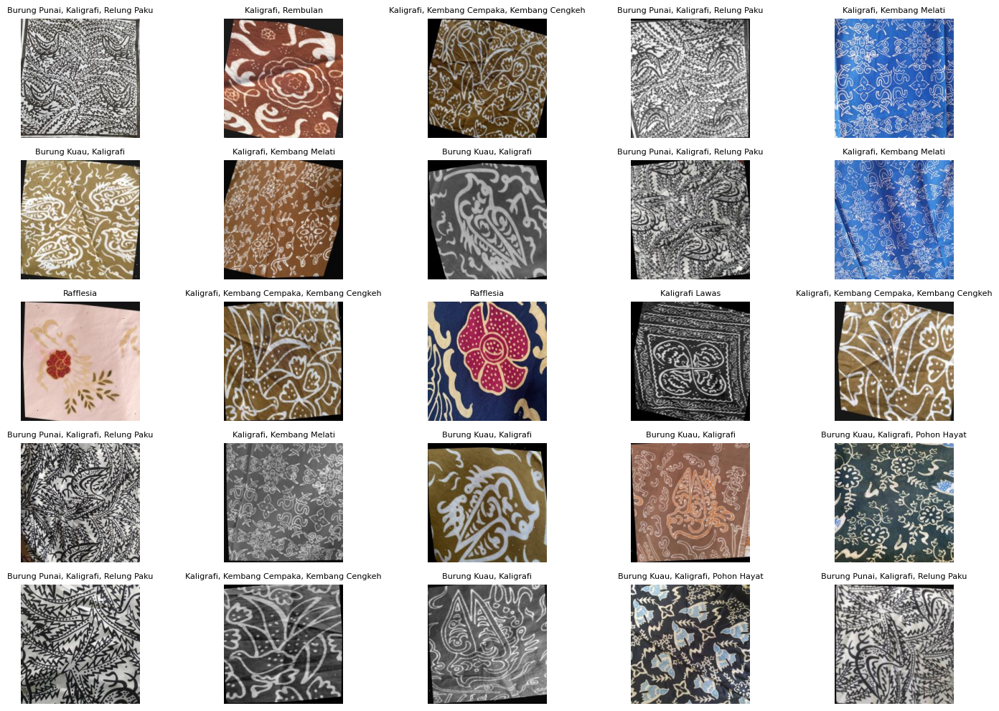

In [9]:
from PIL import Image


# Fungsi untuk konversi row label jadi teks label
def get_labels(row, label_cols):
    return ', '.join([label for label in label_cols if row[label] == 1]) or 'No Label'

# Ambil 25 sampel acak dari train_df
sample_df = train_df.sample(n=25, random_state=44).reset_index(drop=True)
label_cols = train_df.columns[1:]

# Plot gambar
plt.figure(figsize=(15, 10))
for i in range(25):
    img_path = os.path.join(train_img_folder, sample_df.loc[i, 'filename'])
    img = Image.open(img_path).convert('RGB')

    plt.subplot(5, 5, i+1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(get_labels(sample_df.loc[i], label_cols), fontsize=8)

plt.tight_layout()
plt.show()


# **Data Preparation**

### Augmentasi Data Train

In [10]:
label_columns = train_df.columns[1:].tolist()

image_size = (224, 224)
batch_size = 32

# Normalisasi data
datagen = ImageDataGenerator(rescale=1.0 / 255)

### Data Generator



In [11]:
# Train generator
train_generator = datagen.flow_from_dataframe(
    dataframe=train_df,
    directory=train_img_folder,
    x_col='filename',
    y_col=label_columns,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='raw',
    shuffle=True,
)

# Validation generator
valid_generator = datagen.flow_from_dataframe(
    dataframe=valid_df,
    directory=valid_img_folder,
    x_col='filename',
    y_col=label_columns,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='raw',
    shuffle=False
)

# Test generator
test_generator = datagen.flow_from_dataframe(
    dataframe=test_df,
    directory=test_img_folder,
    x_col='filename',
    y_col=label_columns,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='raw',
    shuffle=False
)

Found 6633 validated image filenames.
Found 1894 validated image filenames.
Found 947 validated image filenames.


In [12]:
# Ambil satu batch sample dari train_generator
x_batch, y_batch = next(train_generator)

# Cek shape input dan label
print(f"Shape input batch: {x_batch.shape}")  # Harusnya (batch_size, 224, 224, 3)
print(f"Shape label batch: {y_batch.shape}")  # Harusnya (batch_size, jumlah_kelas)

Shape input batch: (32, 224, 224, 3)
Shape label batch: (32, 11)


# **Modeling**

### Pembuatan Model

In [22]:
from tensorflow.keras.applications import InceptionResNetV2

# Load InceptionResNet tanpa fully connected layer atas (include_top=False)
base_model = InceptionResNetV2(weights="imagenet", include_top=False, input_shape=(224, 224, 3))

# Freeze semua layer di InceptionResNet agar hanya bagian atas yang dilatih
base_model.trainable = False

# Custom head untuk multi-label classification
x = GlobalAveragePooling2D()(base_model.output)
x = Dropout(0.5)(x)
output = Dense(11, activation='sigmoid')(x)  # Multi-label classification

# Gabungkan base model + custom head
model = Model(inputs=base_model.input, outputs=output)


219055592/219055592 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


### Compile Model

In [23]:
# Path penyimpanan model di Google Drive
best_model_path = "/content/drive/MyDrive/Dataset/InceptionResNet_1.h5"

# Compile model dengan optimizer Adam dan AUC sebagai metric
model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss="binary_crossentropy",
    metrics=[tf.keras.metrics.AUC(name="auc")]
)

# Callbacks untuk early stopping, learning rate reduction, dan model checkpoint
callbacks = [
    EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True),
    ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=3, min_lr=1e-7),
    ModelCheckpoint(best_model_path, save_best_only=True, monitor="val_loss", mode="min")
]

# Tampilkan arsitektur model
model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 111, 111, 32)   │            864 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 111, 111, 32)   │             96 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 111, 111, 32)   │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 109, 109, 32)   │          9,216 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 109, 109, 32)   │             96 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 109, 109, 32)   │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 109, 109, 64)   │         18,432 │ activation_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 109, 109, 64)   │            192 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 109, 109, 64)   │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 54, 54, 64)     │              0 │ activation_2[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 54, 54, 80)     │          5,120 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 54, 54, 80)     │            240 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, 54, 54, 80)     │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 52, 52, 192)    │        138,240 │ activation_3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 52, 52, 192)    │            576 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_4 (Activat

 Total params: 54,353,643 (207.34 MB)

 Trainable params: 16,907 (66.04 KB)

 Non-trainable params: 54,336,736 (207.28 MB)

### Train Model

In [24]:
history = model.fit(
    train_generator,
    validation_data=valid_generator,
    epochs=30,
    callbacks=callbacks
)
#20.51 - 22.30
#10.58 - 12.36

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 15s/step - auc: 0.6688 - loss: 0.5407 

208/208 ━━━━━━━━━━━━━━━━━━━━ 4020s 19s/step - auc: 0.6692 - loss: 0.5403 - val_auc: 0.9276 - val_loss: 0.2902 - learning_rate: 1.0000e-04
Epoch 2/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - auc: 0.8792 - loss: 0.3132

208/208 ━━━━━━━━━━━━━━━━━━━━ 50s 242ms/step - auc: 0.8793 - loss: 0.3131 - val_auc: 0.9812 - val_loss: 0.1926 - learning_rate: 1.0000e-04
Epoch 3/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - auc: 0.9447 - loss: 0.2321

208/208 ━━━━━━━━━━━━━━━━━━━━ 83s 248ms/step - auc: 0.9448 - loss: 0.2320 - val_auc: 0.9924 - val_loss: 0.1423 - learning_rate: 1.0000e-04
Epoch 4/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - auc: 0.9725 - loss: 0.1795

208/208 ━━━━━━━━━━━━━━━━━━━━ 48s 231ms/step - auc: 0.9725 - loss: 0.1794 - val_auc: 0.9955 - val_loss: 0.1134 - learning_rate: 1.0000e-04
Epoch 5/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step - auc: 0.9824 - loss: 0.1500

208/208 ━━━━━━━━━━━━━━━━━━━━ 51s 246ms/step - auc: 0.9824 - loss: 0.1500 - val_auc: 0.9972 - val_loss: 0.0932 - learning_rate: 1.0000e-04
Epoch 6/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - auc: 0.9869 - loss: 0.1307

208/208 ━━━━━━━━━━━━━━━━━━━━ 51s 244ms/step - auc: 0.9870 - loss: 0.1306 - val_auc: 0.9978 - val_loss: 0.0797 - learning_rate: 1.0000e-04
Epoch 7/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step - auc: 0.9909 - loss: 0.1130

208/208 ━━━━━━━━━━━━━━━━━━━━ 57s 270ms/step - auc: 0.9909 - loss: 0.1130 - val_auc: 0.9981 - val_loss: 0.0695 - learning_rate: 1.0000e-04
Epoch 8/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - auc: 0.9924 - loss: 0.1028

208/208 ━━━━━━━━━━━━━━━━━━━━ 49s 232ms/step - auc: 0.9924 - loss: 0.1028 - val_auc: 0.9984 - val_loss: 0.0622 - learning_rate: 1.0000e-04
Epoch 9/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - auc: 0.9943 - loss: 0.0916

208/208 ━━━━━━━━━━━━━━━━━━━━ 85s 246ms/step - auc: 0.9943 - loss: 0.0916 - val_auc: 0.9985 - val_loss: 0.0557 - learning_rate: 1.0000e-04
Epoch 10/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step - auc: 0.9953 - loss: 0.0834

208/208 ━━━━━━━━━━━━━━━━━━━━ 54s 258ms/step - auc: 0.9953 - loss: 0.0834 - val_auc: 0.9988 - val_loss: 0.0504 - learning_rate: 1.0000e-04
Epoch 11/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - auc: 0.9957 - loss: 0.0780

208/208 ━━━━━━━━━━━━━━━━━━━━ 78s 238ms/step - auc: 0.9957 - loss: 0.0780 - val_auc: 0.9989 - val_loss: 0.0464 - learning_rate: 1.0000e-04
Epoch 12/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step - auc: 0.9959 - loss: 0.0730

208/208 ━━━━━━━━━━━━━━━━━━━━ 85s 252ms/step - auc: 0.9959 - loss: 0.0730 - val_auc: 0.9990 - val_loss: 0.0425 - learning_rate: 1.0000e-04
Epoch 13/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step - auc: 0.9971 - loss: 0.0672

208/208 ━━━━━━━━━━━━━━━━━━━━ 51s 244ms/step - auc: 0.9971 - loss: 0.0672 - val_auc: 0.9992 - val_loss: 0.0390 - learning_rate: 1.0000e-04
Epoch 14/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - auc: 0.9975 - loss: 0.0620

208/208 ━━━━━━━━━━━━━━━━━━━━ 49s 235ms/step - auc: 0.9975 - loss: 0.0620 - val_auc: 0.9993 - val_loss: 0.0363 - learning_rate: 1.0000e-04
Epoch 15/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - auc: 0.9973 - loss: 0.0601

208/208 ━━━━━━━━━━━━━━━━━━━━ 82s 235ms/step - auc: 0.9973 - loss: 0.0601 - val_auc: 0.9994 - val_loss: 0.0338 - learning_rate: 1.0000e-04
Epoch 16/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - auc: 0.9978 - loss: 0.0560

208/208 ━━━━━━━━━━━━━━━━━━━━ 83s 240ms/step - auc: 0.9978 - loss: 0.0560 - val_auc: 0.9994 - val_loss: 0.0319 - learning_rate: 1.0000e-04
Epoch 17/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - auc: 0.9978 - loss: 0.0541

208/208 ━━━━━━━━━━━━━━━━━━━━ 50s 239ms/step - auc: 0.9978 - loss: 0.0541 - val_auc: 0.9995 - val_loss: 0.0299 - learning_rate: 1.0000e-04
Epoch 18/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step - auc: 0.9980 - loss: 0.0516

208/208 ━━━━━━━━━━━━━━━━━━━━ 52s 249ms/step - auc: 0.9980 - loss: 0.0516 - val_auc: 0.9995 - val_loss: 0.0282 - learning_rate: 1.0000e-04
Epoch 19/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - auc: 0.9982 - loss: 0.0488

208/208 ━━━━━━━━━━━━━━━━━━━━ 79s 236ms/step - auc: 0.9982 - loss: 0.0488 - val_auc: 0.9995 - val_loss: 0.0271 - learning_rate: 1.0000e-04
Epoch 20/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - auc: 0.9984 - loss: 0.0457

208/208 ━━━━━━━━━━━━━━━━━━━━ 53s 252ms/step - auc: 0.9984 - loss: 0.0457 - val_auc: 0.9996 - val_loss: 0.0253 - learning_rate: 1.0000e-04
Epoch 21/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - auc: 0.9987 - loss: 0.0431

208/208 ━━━━━━━━━━━━━━━━━━━━ 76s 226ms/step - auc: 0.9987 - loss: 0.0431 - val_auc: 0.9996 - val_loss: 0.0242 - learning_rate: 1.0000e-04
Epoch 22/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - auc: 0.9986 - loss: 0.0428

208/208 ━━━━━━━━━━━━━━━━━━━━ 50s 240ms/step - auc: 0.9986 - loss: 0.0428 - val_auc: 0.9997 - val_loss: 0.0228 - learning_rate: 1.0000e-04
Epoch 23/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - auc: 0.9987 - loss: 0.0412

208/208 ━━━━━━━━━━━━━━━━━━━━ 83s 248ms/step - auc: 0.9987 - loss: 0.0412 - val_auc: 0.9997 - val_loss: 0.0215 - learning_rate: 1.0000e-04
Epoch 24/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step - auc: 0.9988 - loss: 0.0393

208/208 ━━━━━━━━━━━━━━━━━━━━ 84s 257ms/step - auc: 0.9988 - loss: 0.0393 - val_auc: 0.9997 - val_loss: 0.0207 - learning_rate: 1.0000e-04
Epoch 25/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - auc: 0.9989 - loss: 0.0386

208/208 ━━━━━━━━━━━━━━━━━━━━ 49s 235ms/step - auc: 0.9989 - loss: 0.0386 - val_auc: 0.9997 - val_loss: 0.0198 - learning_rate: 1.0000e-04
Epoch 26/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - auc: 0.9992 - loss: 0.0353

208/208 ━━━━━━━━━━━━━━━━━━━━ 84s 244ms/step - auc: 0.9992 - loss: 0.0353 - val_auc: 0.9998 - val_loss: 0.0190 - learning_rate: 1.0000e-04
Epoch 27/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step - auc: 0.9992 - loss: 0.0353

208/208 ━━━━━━━━━━━━━━━━━━━━ 52s 247ms/step - auc: 0.9992 - loss: 0.0353 - val_auc: 0.9998 - val_loss: 0.0182 - learning_rate: 1.0000e-04
Epoch 28/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step - auc: 0.9992 - loss: 0.0340

208/208 ━━━━━━━━━━━━━━━━━━━━ 51s 243ms/step - auc: 0.9992 - loss: 0.0340 - val_auc: 0.9998 - val_loss: 0.0173 - learning_rate: 1.0000e-04
Epoch 29/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - auc: 0.9993 - loss: 0.0318

208/208 ━━━━━━━━━━━━━━━━━━━━ 49s 235ms/step - auc: 0.9993 - loss: 0.0318 - val_auc: 0.9998 - val_loss: 0.0168 - learning_rate: 1.0000e-04
Epoch 30/30
208/208 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - auc: 0.9990 - loss: 0.0338

208/208 ━━━━━━━━━━━━━━━━━━━━ 50s 239ms/step - auc: 0.9990 - loss: 0.0338 - val_auc: 0.9998 - val_loss: 0.0160 - learning_rate: 1.0000e-04


### Plotting

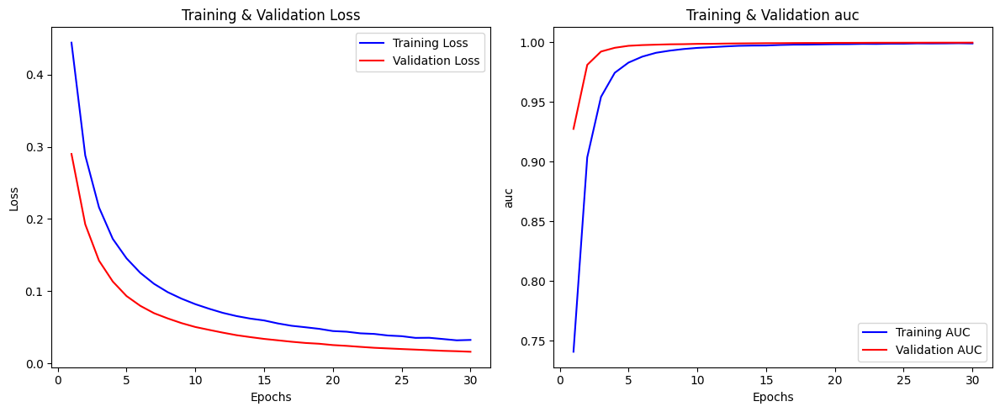

In [25]:
# Ambil data dari history
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_auc = history.history['auc']
val_auc = history.history['val_auc']

epochs = range(1, len(train_loss) + 1)

# Plot Loss
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(epochs, train_loss, 'b-', label='Training Loss')
plt.plot(epochs, val_loss, 'r-', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training & Validation Loss')
plt.legend()

# Plot AUC
plt.subplot(1, 2, 2)
plt.plot(epochs, train_auc, 'b-', label='Training AUC')
plt.plot(epochs, val_auc, 'r-', label='Validation AUC')
plt.xlabel('Epochs')
plt.ylabel('auc')
plt.title('Training & Validation auc')
plt.legend()

plt.tight_layout()
plt.show()


# **Evaluasi**

In [26]:
model.save("/content/drive/MyDrive/Dataset/InceptionResNet_2.h5")

In [28]:
model.save("/content/drive/MyDrive/Dataset/InceptionResNet.keras", save_format="keras")


### Prediksi dengan test set

In [21]:
import h5py

# Cek isi file H5 tanpa load model
with h5py.File("/content/drive/MyDrive/Dataset/InceptionResNet_1.h5", "r") as f:
    print("Layers dalam model:")
    for key in f.keys():
        print(key)


Layers dalam model:
model_weights
optimizer_weights


In [29]:
# Load model
best_model_path = "/content/drive/MyDrive/Dataset/InceptionResNet.keras"
model = tf.keras.models.load_model(best_model_path)

# Prediksi pada test set
y_pred_prob = model.predict(test_generator)
y_pred = (y_pred_prob > 0.5).astype(int)

test_loss, test_auc = model.evaluate(test_generator)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test AUC: {test_auc:.4f}")

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 4 variables whereas the saved optimizer has 6 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


30/30 ━━━━━━━━━━━━━━━━━━━━ 427s 14s/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 23s 345ms/step - auc: 0.9994 - loss: 0.0185
Test Loss: 0.0177
Test AUC: 0.9997


### Classification Report

In [30]:
# Ambil label asli
y_true = test_df.iloc[:, 1:].values  # Mengambil nilai label dari dataframe
labels = test_df.columns[1:].tolist()

# Classification Report
print(classification_report(y_true, y_pred, target_names=labels))

                 precision    recall  f1-score   support

    Burung Kuau       1.00      0.94      0.97       232
   Burung Punai       1.00      1.00      1.00       112
      Kaligrafi       0.99      1.00      1.00       701
Kaligrafi Lawas       1.00      0.98      0.99       122
Kembang Cempaka       0.99      1.00      1.00       117
Kembang Cengkeh       0.99      1.00      1.00       117
 Kembang Melati       0.99      0.99      0.99       119
    Pohon Hayat       0.98      1.00      0.99       116
      Rafflesia       1.00      0.96      0.98       124
    Relung Paku       1.00      1.00      1.00       112
       Rembulan       0.99      0.98      0.99       121

      micro avg       0.99      0.99      0.99      1993
      macro avg       0.99      0.99      0.99      1993
   weighted avg       0.99      0.99      0.99      1993
    samples avg       0.99      0.98      0.98      1993



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


### Confussion Matrix

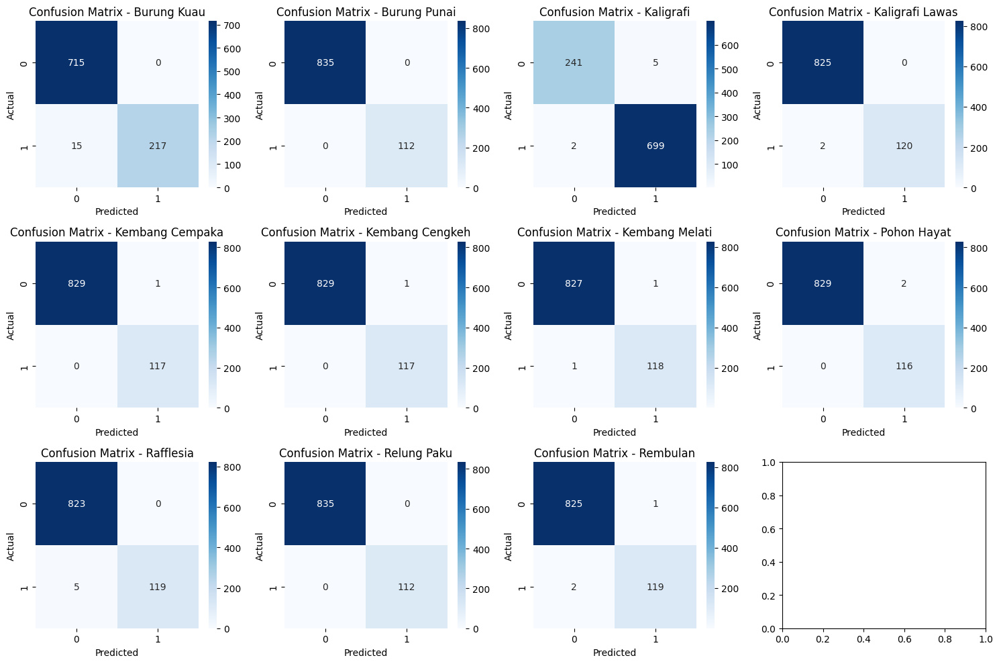

In [31]:
# Cell 3: Confusion Matrix per Label
from sklearn.metrics import classification_report, multilabel_confusion_matrix

cm_list = multilabel_confusion_matrix(y_true, y_pred)
fig, axes = plt.subplots(3, 4, figsize=(15, 10))
axes = axes.ravel()

for i, (label, cm) in enumerate(zip(labels, cm_list)):
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", ax=axes[i])
    axes[i].set_title(f'Confusion Matrix - {label}')
    axes[i].set_xlabel('Predicted')
    axes[i].set_ylabel('Actual')

plt.tight_layout()
plt.show()


### Menampilkan Gambar dengan Label dan Prediksi

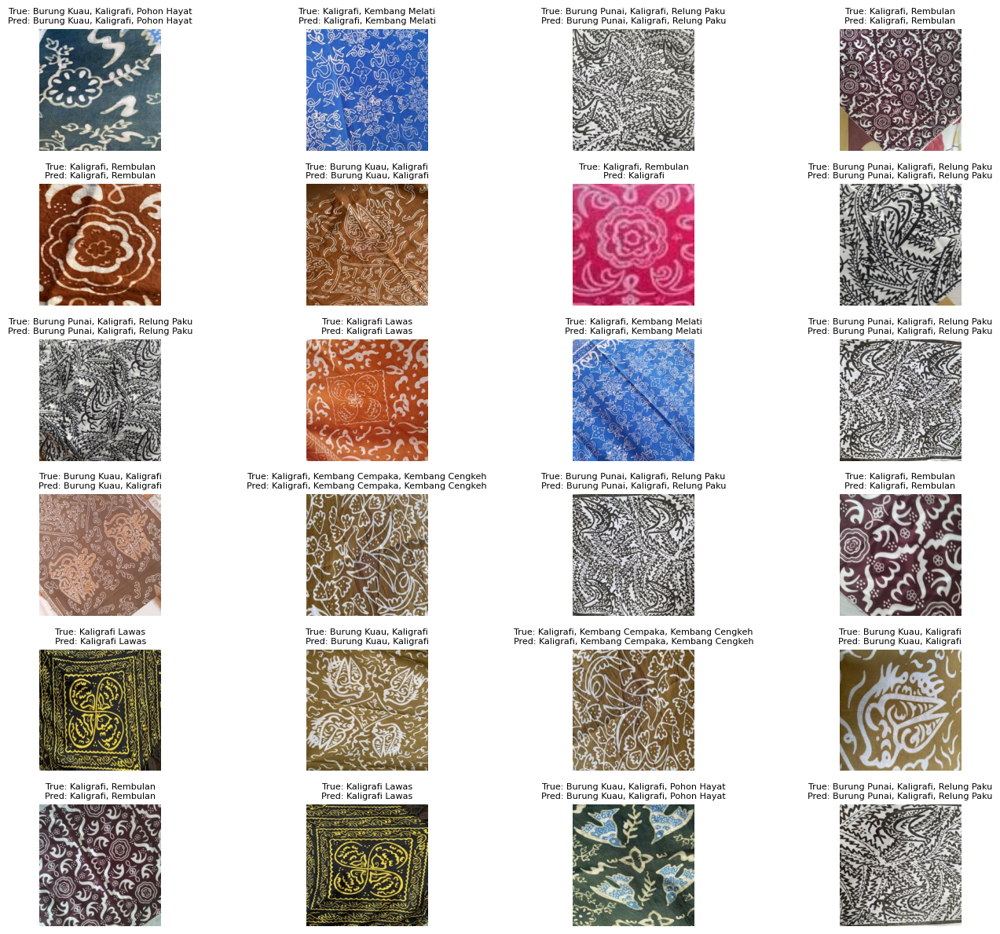

In [32]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Load model
best_model_path = "/content/drive/MyDrive/Dataset/InceptionResNet.keras"
model = tf.keras.models.load_model(best_model_path, compile=False)

# Ambil sampel data
num_samples = 24
sample_df = test_df.sample(num_samples, random_state=42)

# Buat plot
fig, axes = plt.subplots(6, 4, figsize=(15, 12))
axes = axes.ravel()

for i, (index, row) in enumerate(sample_df.iterrows()):
    img_path = os.path.join(test_img_folder, row["filename"])

    if os.path.exists(img_path):  # Pastikan file ada
        img = load_img(img_path, target_size=(224, 224))
        img_array = np.expand_dims(img_to_array(img) / 255.0, axis=0)

        # Prediksi
        y_pred_prob = model.predict(img_array, verbose=0)
        y_pred = (y_pred_prob > 0.5).astype(int).flatten()  # Perbaikan di sini
        y_true = row[1:].values.astype(int)

        # Label asli & prediksi
        true_labels = [label for label, t in zip(test_df.columns[1:], y_true) if t == 1]
        pred_labels = [label for label, p in zip(test_df.columns[1:], y_pred) if p == 1]

        # Plot gambar
        axes[i].imshow(img)
        axes[i].axis("off")
        axes[i].set_title(f"True: {', '.join(true_labels)}\nPred: {', '.join(pred_labels)}", fontsize=8)

# Atur tata letak agar lebih rapi
plt.subplots_adjust(hspace=1.0, wspace=0.5)
plt.tight_layout()
plt.show()


### Performa Metrik untuk Valid Data

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 4 variables whereas the saved optimizer has 6 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


60/60 ━━━━━━━━━━━━━━━━━━━━ 35s 396ms/step

=== Model Performance on Validation Set ===
   Accuracy  Precision    Recall       AUC     Kappa  F1_score  Final_score
0  0.975185   0.998121  0.985804  0.999673  0.973165  0.991857     0.988232


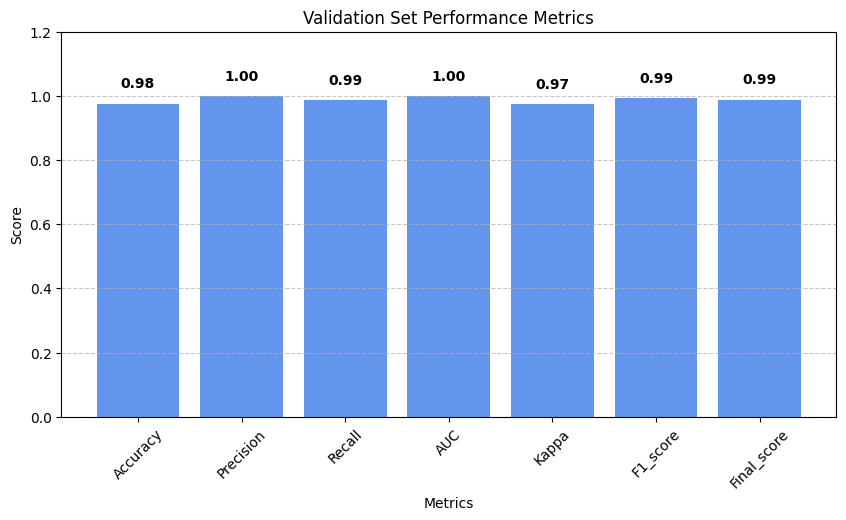

In [33]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, cohen_kappa_score

# Load model yang telah dilatih
model_path = "/content/drive/MyDrive/Dataset/InceptionResNet.keras"
model = tf.keras.models.load_model(model_path)


y_true_valid = valid_generator.labels  # Label asli dari valid set
y_pred_probs_valid = model.predict(valid_generator)  # Probabilitas prediksi

# Konversi ke label biner (untuk evaluasi multi-label)
y_pred_valid = (y_pred_probs_valid >= 0.5).astype(int)  # Threshold 0.5

# Menghitung metrik evaluasi
accuracy_valid = accuracy_score(y_true_valid, y_pred_valid)
precision_valid = precision_score(y_true_valid, y_pred_valid, average='macro')
recall_valid = recall_score(y_true_valid, y_pred_valid, average='macro')
f1_valid = f1_score(y_true_valid, y_pred_valid, average='macro')
auc_valid = roc_auc_score(y_true_valid, y_pred_probs_valid, average='macro')
kappa_valid = cohen_kappa_score(y_true_valid.argmax(axis=1), y_pred_valid.argmax(axis=1))

# **Menghitung Final Score sebagai rata-rata dari F1-score, Kappa, dan AUC**
final_score_valid = np.mean([f1_valid, kappa_valid, auc_valid])

# Membuat tabel hasil evaluasi untuk validasi set
metrics_valid = {
    "Accuracy": [accuracy_valid],
    "Precision": [precision_valid],
    "Recall": [recall_valid],
    "AUC": [auc_valid],
    "Kappa": [kappa_valid],
    "F1_score": [f1_valid],
    "Final_score": [final_score_valid]  # Final score dari rata-rata F1-score, Kappa, dan AUC
}


df_valid = pd.DataFrame(metrics_valid)
print("\n=== Model Performance on Validation Set ===")
print(df_valid)

# **Visualisasi bar plot
plt.figure(figsize=(10, 5))
bars = plt.bar(df_valid.columns, df_valid.loc[0], color='cornflowerblue')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2,
             yval + 0.05,
             f"{yval:.2f}",
             ha='center',
             fontsize=10,
             fontweight='bold')

plt.xlabel("Metrics")
plt.ylabel("Score")
plt.title("Validation Set Performance Metrics")
plt.ylim(0, 1.2)  # **Batas atas diperbesar agar ada ruang untuk teks**
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)  # **Menambah grid horizontal untuk estetika**
plt.show()


### Performa Metrik Untuk Test Data

30/30 ━━━━━━━━━━━━━━━━━━━━ 10s 346ms/step

=== Model Performance on Test Set ===
   Accuracy  Precision   Recall       AUC     Kappa  F1_score  Final_score
0  0.963041   0.994751  0.98644  0.999708  0.961803  0.990442     0.983984


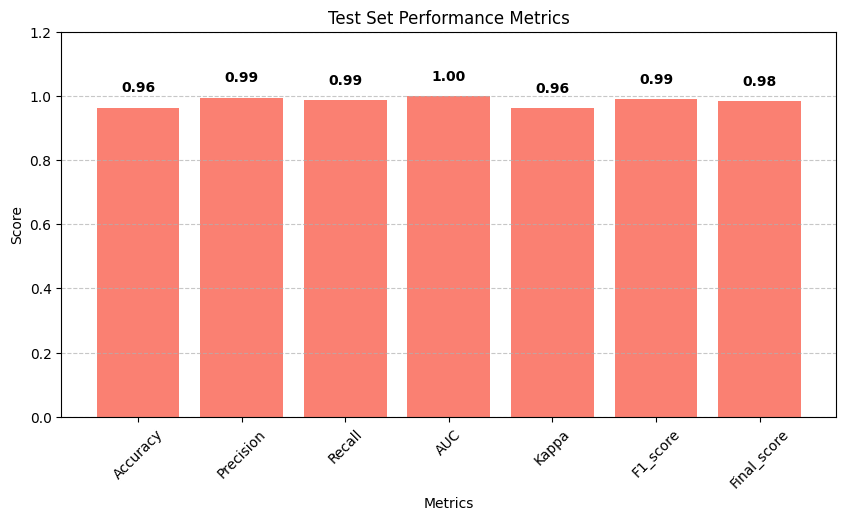

In [34]:
# Pastikan test_generator sudah dibuat sebelumnya
y_true_test = test_generator.labels  # Label asli dari test set
y_pred_probs_test = model.predict(test_generator)  # Probabilitas prediksi

# Konversi ke label biner (untuk evaluasi multi-label)
y_pred_test = (y_pred_probs_test >= 0.5).astype(int)  # Threshold 0.5

# Menghitung metrik evaluasi
accuracy_test = accuracy_score(y_true_test, y_pred_test)
precision_test = precision_score(y_true_test, y_pred_test, average='macro')
recall_test = recall_score(y_true_test, y_pred_test, average='macro')
f1_test = f1_score(y_true_test, y_pred_test, average='macro')
auc_test = roc_auc_score(y_true_test, y_pred_probs_test, average='macro')
kappa_test = cohen_kappa_score(y_true_test.argmax(axis=1), y_pred_test.argmax(axis=1))

# **Menghitung Final Score sebagai rata-rata semua metrik**
final_score_test = np.mean([f1_test, kappa_test, auc_test])

# Membuat tabel hasil evaluasi untuk test set
metrics_test = {
    "Accuracy": [accuracy_test],
    "Precision": [precision_test],
    "Recall": [recall_test],
    "AUC": [auc_test],
    "Kappa": [kappa_test],
    "F1_score": [f1_test],
    "Final_score": [final_score_test]  # Final score dari rata-rata F1-score, Kappa, dan AUC
}

df_test = pd.DataFrame(metrics_test)
print("\n=== Model Performance on Test Set ===")
print(df_test)

# **Visualisasi bar plot dengan nilai metrik di atas batang (jarak lebih rapi)**
plt.figure(figsize=(10, 5))
bars = plt.bar(df_test.columns, df_test.loc[0], color='salmon')

# Menambahkan nilai di atas setiap batang dengan jarak lebih rapi
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2,
             yval + 0.05,  # **Menambah jarak dari batang agar lebih rapi**
             f"{yval:.2f}",
             ha='center',
             fontsize=10,
             fontweight='bold')

plt.xlabel("Metrics")
plt.ylabel("Score")
plt.title("Test Set Performance Metrics")
plt.ylim(0, 1.2)  # **Batas atas diperbesar agar ada ruang untuk teks**
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)  # **Menambah grid horizontal untuk estetika**
plt.show()


# **Prediksi dengan Interface**

In [ ]:
!pip install gradio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.3/51.3 MB 15.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 322.2/322.2 kB 25.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.2/95.2 kB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.3/11.3 MB 118.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 6.1 MB/s eta 0:00:00


In [ ]:
import gradio as gr
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Load model
best_model_path = "/content/drive/MyDrive/Dataset/InceptionResNet_1.h5"
model = tf.keras.models.load_model(best_model_path, compile=False)

# Label kategori
labels = ['Burung Kuau', 'Burung Punai', 'Kaligrafi', 'Kaligrafi Lawas', 'Kembang Cempaka',
          'Kembang Cengkeh', 'Kembang Melati', 'Pohon Hayat', 'Rafflesia', 'Relung Paku', 'Rembulan']

# Fungsi prediksi
def predict(image):
    img = image.resize((224, 224))  # Resize gambar
    img_array = np.expand_dims(img_to_array(img) / 255.0, axis=0)  # Normalisasi

    y_pred_prob = model.predict(img_array, verbose=0)
    y_pred = (y_pred_prob > 0.5).astype(int).flatten()

    pred_labels = [label for label, p in zip(labels, y_pred) if p == 1]
    return ', '.join(pred_labels) if pred_labels else "Tidak terdeteksi"

# Setup Gradio
iface = gr.Interface(
    fn=predict,
    inputs=gr.Image(type="pil"),
    outputs=gr.Textbox(label="Hasil Prediksi"),
    title="Klasifikasi Motif Batik Besurek",
    description="Upload gambar batik besurek, lalu lihat hasil prediksi model!"
)

# Jalankan aplikasi
iface.launch()

Running Gradio in a Colab notebook requires sharing enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://e6de43592ae2202570.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


# **Prediksi dengan Input Data Internet**


Silakan upload gambar untuk prediksi:


Saving 3c0408349264d0cd33f2b618b291f5ee.jpg to 3c0408349264d0cd33f2b618b291f5ee.jpg


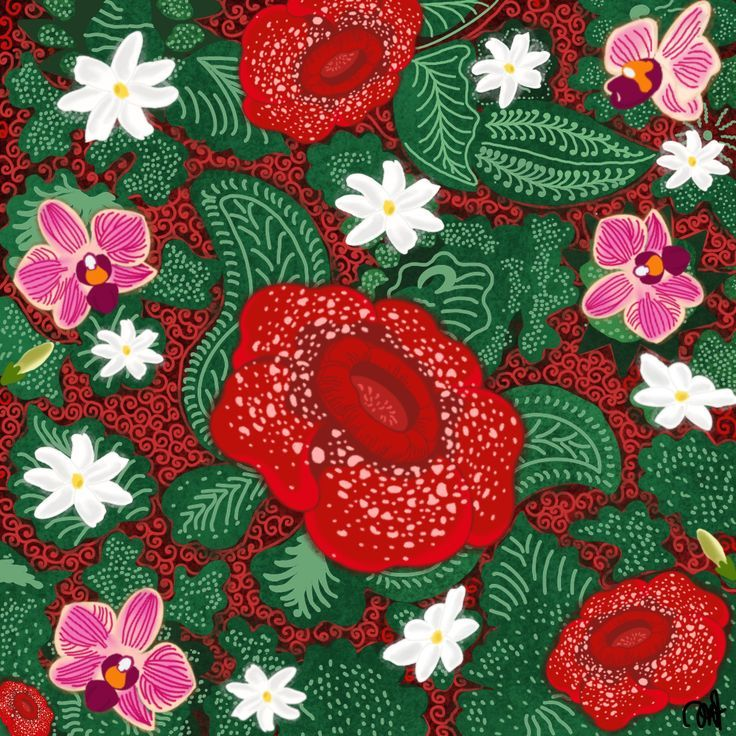


=== Hasil Prediksi ===
Rafflesia

Ingin upload gambar lain? (ya/tidak): ya

Silakan upload gambar untuk prediksi:


Saving burung kuau.jpeg to burung kuau.jpeg


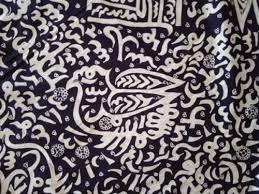


=== Hasil Prediksi ===
Burung Kuau, Kaligrafi

Ingin upload gambar lain? (ya/tidak): ya

Silakan upload gambar untuk prediksi:


Saving relung paku.png to relung paku.png


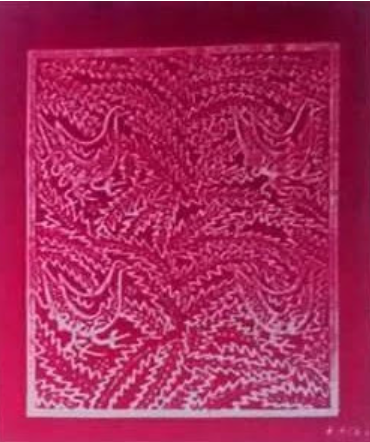


=== Hasil Prediksi ===
Burung Punai, Kaligrafi, Relung Paku

Ingin upload gambar lain? (ya/tidak): ya

Silakan upload gambar untuk prediksi:


Saving kembang cengkeh kembang cempaka.png to kembang cengkeh kembang cempaka.png


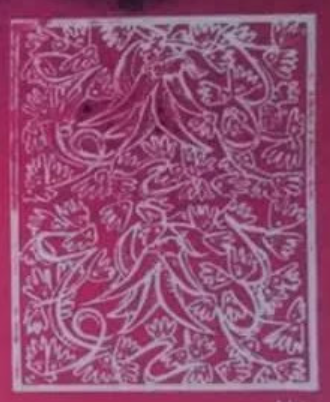


=== Hasil Prediksi ===
Kaligrafi

Ingin upload gambar lain? (ya/tidak): ya

Silakan upload gambar untuk prediksi:


Saving rembulan.jpeg to rembulan.jpeg


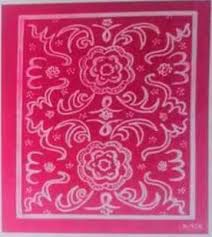


=== Hasil Prediksi ===
Kaligrafi

Ingin upload gambar lain? (ya/tidak): ya

Silakan upload gambar untuk prediksi:


Saving Screenshot 2025-03-24 225529.png to Screenshot 2025-03-24 225529.png


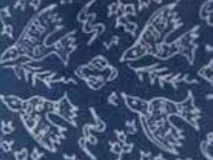


=== Hasil Prediksi ===
Burung Kuau, Kaligrafi

Ingin upload gambar lain? (ya/tidak): ya

Silakan upload gambar untuk prediksi:


Saving rembulann.jpeg to rembulann.jpeg


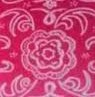


=== Hasil Prediksi ===
Burung Kuau, Kaligrafi, Rembulan

Ingin upload gambar lain? (ya/tidak): ya

Silakan upload gambar untuk prediksi:


Saving kaligrafi arab.jpeg to kaligrafi arab.jpeg


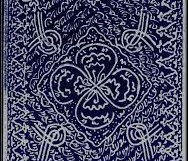


=== Hasil Prediksi ===
Kaligrafi, Kaligrafi Lawas

Ingin upload gambar lain? (ya/tidak): ya

Silakan upload gambar untuk prediksi:


Saving images (12).jpeg to images (12).jpeg


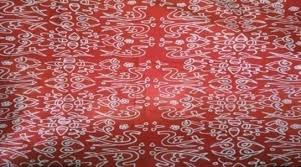


=== Hasil Prediksi ===
Kaligrafi

Ingin upload gambar lain? (ya/tidak): ya

Silakan upload gambar untuk prediksi:


Saving Ilustrasi-Kain-Besurek-Bengkulu-Dok.-Kibrispdr.jpg to Ilustrasi-Kain-Besurek-Bengkulu-Dok.-Kibrispdr.jpg


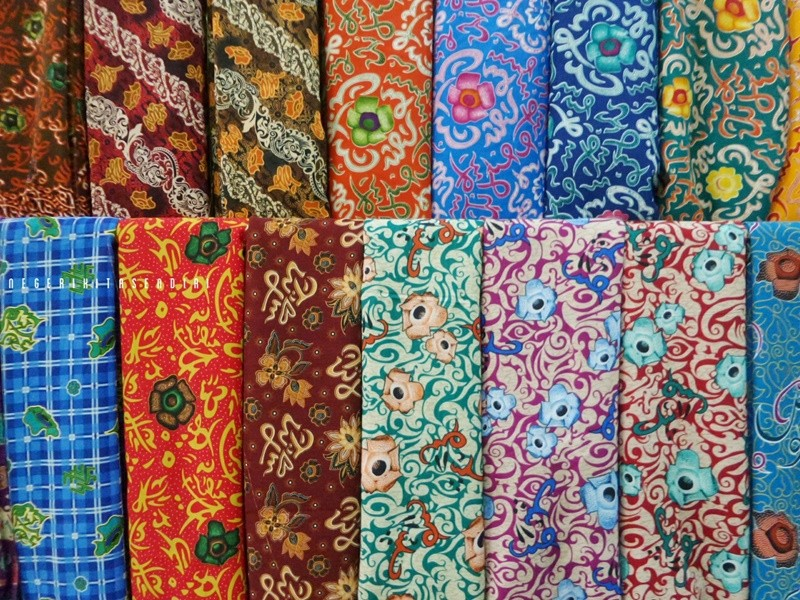


=== Hasil Prediksi ===
Tidak terdeteksi

Ingin upload gambar lain? (ya/tidak): ya

Silakan upload gambar untuk prediksi:


Saving id-11134207-7r98v-lqu2zwdcr88vf0-1-a034866faddc3ffc6bb5b00b6031feb6-18e6e5af8f9198e45cfe56abc88529b1.jpeg to id-11134207-7r98v-lqu2zwdcr88vf0-1-a034866faddc3ffc6bb5b00b6031feb6-18e6e5af8f9198e45cfe56abc88529b1.jpeg


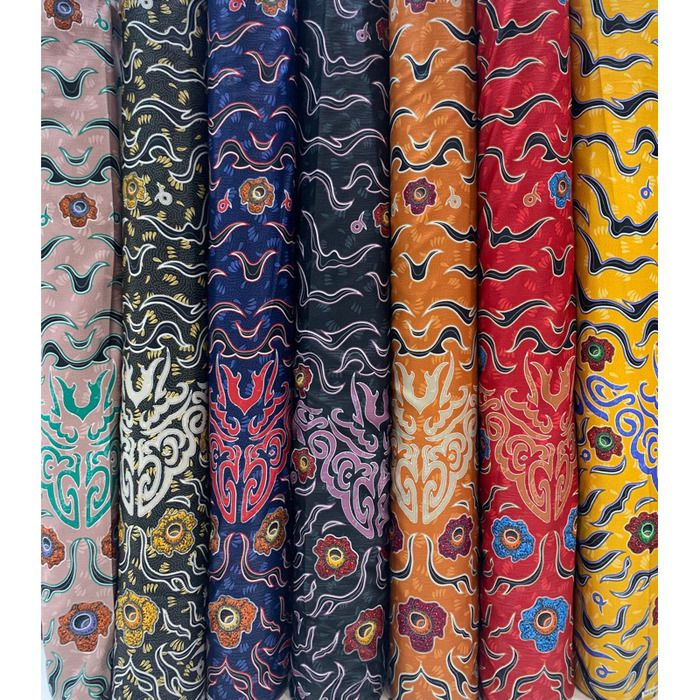


=== Hasil Prediksi ===
Tidak terdeteksi

Ingin upload gambar lain? (ya/tidak): ya

Silakan upload gambar untuk prediksi:


Saving images (6).jpeg to images (6).jpeg


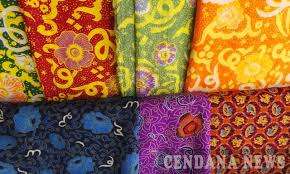


=== Hasil Prediksi ===
Tidak terdeteksi

Ingin upload gambar lain? (ya/tidak): ya

Silakan upload gambar untuk prediksi:


Saving images (8).jpeg to images (8).jpeg


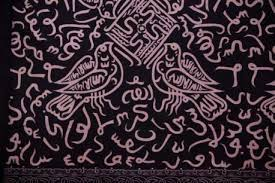


=== Hasil Prediksi ===
Burung Kuau, Kaligrafi, Pohon Hayat

Ingin upload gambar lain? (ya/tidak): ya

Silakan upload gambar untuk prediksi:


Saving Motif-Arab-pada-Basurek-300x225.jpg to Motif-Arab-pada-Basurek-300x225.jpg


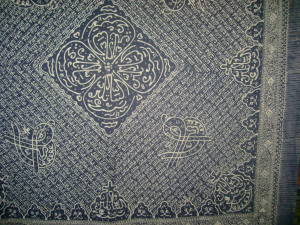


=== Hasil Prediksi ===
Kaligrafi Lawas

Ingin upload gambar lain? (ya/tidak): ya

Silakan upload gambar untuk prediksi:


Saving Batik Besurek-8.jpg to Batik Besurek-8.jpg


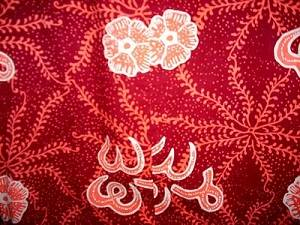


=== Hasil Prediksi ===
Kaligrafi

Ingin upload gambar lain? (ya/tidak): tidak

Terima kasih! Selesai.


In [ ]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from google.colab import files
import IPython.display as display
from PIL import Image

# Load model
best_model_path = "/content/drive/MyDrive/Dataset/InceptionResNet_1.h5"
model = tf.keras.models.load_model(best_model_path, compile=False)

# Label kategori
labels = ['Burung Kuau', 'Burung Punai', 'Kaligrafi', 'Kaligrafi Lawas', 'Kembang Cempaka',
          'Kembang Cengkeh', 'Kembang Melati', 'Pohon Hayat', 'Rafflesia', 'Relung Paku', 'Rembulan']

# Fungsi prediksi
def predict(image_path):
    img = load_img(image_path, target_size=(224, 224))  # Resize gambar
    img_array = np.expand_dims(img_to_array(img) / 255.0, axis=0)  # Normalisasi

    y_pred_prob = model.predict(img_array, verbose=0)
    y_pred = (y_pred_prob > 0.5).astype(int).flatten()

    pred_labels = [label for label, p in zip(labels, y_pred) if p == 1]
    return ', '.join(pred_labels) if pred_labels else "Tidak terdeteksi"

# Loop untuk upload & prediksi
while True:
    print("\nSilakan upload gambar untuk prediksi:")
    uploaded = files.upload()

    if uploaded:
        image_path = list(uploaded.keys())[0]
        img = Image.open(image_path)

        # Tampilkan gambar
        display.display(img)

        # Prediksi
        hasil_prediksi = predict(image_path)
        print("\n=== Hasil Prediksi ===")
        print(hasil_prediksi)

    # Tanya apakah ingin upload lagi
    lanjut = input("\nIngin upload gambar lain? (ya/tidak): ").strip().lower()
    if lanjut != "ya":
        print("\nTerima kasih! Selesai.")
        break
